In [219]:
import torch
import torch.nn as nn
from tqdm import tqdm
from PIL import Image
import os
import matplotlib.pyplot as plt

INTERVAL = 10
INTERVAL_SQUARED = INTERVAL**2
NUM_BINS = INTERVAL**3+INTERVAL**2+INTERVAL+1


def convert_rgb_tensor_to_key(tensor_data):
    scaled_data = (tensor_data*INTERVAL).to(torch.long)
    bucket = scaled_data[:,0]*INTERVAL_SQUARED+scaled_data[:,1]*INTERVAL+scaled_data[:,2]
    return bucket

class WeightedMSELoss(nn.MSELoss):
    
    def __init__(self, value_embedding_layer):
        super().__init__(reduction="none")
        self.value_embedding_layer = value_embedding_layer

        
    def forward(self, input, target):
        mse_loss = super().forward(input, target)
        bucket = convert_rgb_tensor_to_key(target)
        value_embeddings = self.value_embedding_layer(bucket).squeeze()
        mse_loss = torch.mean(mse_loss, dim=1)
        weighted_mse_loss = (mse_loss * value_embeddings).mean()
        return weighted_mse_loss


In [220]:
import torch
from torch.utils.data import Dataset, DataLoader, RandomSampler, random_split
from torchvision import transforms
from pathlib import Path
from PIL import Image
from torchvision.models import efficientnet_b7, EfficientNet_B7_Weights
# from torchsummary import summary
from kornia import color

In [221]:
class Places365Train(Dataset):
    def __init__(self, root: Path):
        self.data_dir = root
        self.data_paths = list(self.data_dir.rglob("*.jpg"))

    def __len__(self):
        return len(self.data_paths)

    def __getitem__(self, idx: int) -> tuple[torch.Tensor, torch.Tensor]:
        """Read an image and convert it to black and white and lab color space.

        Args:
            idx (int): Image index

        Returns:
            tuple[torch.Tensor, torch.Tensor]: Black and white image and lab color space image
        """
        with Image.open(self.data_paths[idx]) as img:
            rgb_img = transforms.ToTensor()(img.convert("RGB"))  # (3, 256, 256)
            bw_img = transforms.ToTensor()(img.convert("L"))  # (1, 256, 256)
            bw_img = bw_img.repeat(3, 1, 1)  # (3, 256, 256)

        lab_img = color.rgb_to_lab(rgb_img)  # (3, 256, 256) -> L, a, b
        lab_img[0] = lab_img[0] / 100  # L channel
        lab_img[1:] = lab_img[1:] / 128  # a, b channel

        return bw_img, rgb_img

    @staticmethod
    def lab_to_rgb(lab_img: torch.Tensor) -> torch.Tensor:
        return lab_img
        """Convert lab image to rgb image.

        Args:
            lab_img (torch.Tensor): Lab color space image

        Returns:
            torch.Tensor: RGB image
        """
        lab_img[0] = lab_img[0] * 100  # L channel
        lab_img[1:] = lab_img[1:] * 128  # a, b channel
        rgb_img = color.lab_to_rgb(lab_img)
        return rgb_img

In [222]:
!wget https://cgl.ethz.ch/Downloads/Data/Davis/DAVIS-data.zip
!unzip -q /kaggle/working/DAVIS-data.zip
!rm /kaggle/working/DAVIS-data.zip
!rm -rf /kaggle/working/DAVIS/JPEGImages/1080p

--2024-02-24 05:25:52--  https://cgl.ethz.ch/Downloads/Data/Davis/DAVIS-data.zip
Resolving cgl.ethz.ch (cgl.ethz.ch)... 129.132.145.103
Connecting to cgl.ethz.ch (cgl.ethz.ch)|129.132.145.103|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1958016855 (1.8G) [application/zip]
Saving to: 'DAVIS-data.zip'

DAVIS-data.zip      100%[===================>]   1.82G  22.9MB/s    in 85s     

2024-02-24 05:27:18 (22.1 MB/s) - 'DAVIS-data.zip' saved [1958016855/1958016855]

replace DAVIS/ImageSets/480p/trainval.txt? [y]es, [n]o, [A]ll, [N]one, [r]ename: ^C


In [223]:
# !wget http://images.cocodataset.org/zips/val2014.zip
# !unzip -q /kaggle/working/val2014.zip
# !rm /kaggle/working/val2014.zip

In [342]:

def resize_images(directory):
    for filename in tqdm(os.listdir(directory)):
        if filename.endswith(".jpg") or filename.endswith(".png"):  # Or other image extensions
            img_path = os.path.join(directory, filename)
            img = Image.open(img_path)
            if img.width == 256 and img.height == 256:
                break
            img = img.resize((256, 256), Image.LANCZOS)  # Resize with high-quality resampling
            img.save(img_path, quality=95)  

# directory = '/kaggle/working/val2014' 

# resize_images(directory)

In [343]:
%%capture
directory = "/kaggle/input/vqa-val-2014/val2014/kaggle/working/val2014"
vid_directory = 'DAVIS/JPEGImages/480p'

for folder in os.listdir(vid_directory):
    path = os.path.join(vid_directory, folder)
    resize_images(path)

In [344]:
import torch
from torch.utils.data import Subset
# from sklearn.model_selection import train_test_split


dataset = Places365Train(Path(directory))
vid_dataset = Places365Train(Path(vid_directory))

In [345]:
len(dataset), len(vid_dataset)

(40504, 3455)

In [346]:
import torch
from torch.utils.data import random_split

train_ratio = 0.8
test_ratio = 0.2  
dataset_size = len(dataset)
train_size = int(train_ratio * dataset_size)
test_size = dataset_size - train_size

train_set, val_set = random_split(dataset, [train_size, test_size])

In [347]:
occurrence = torch.zeros(NUM_BINS)
for data in tqdm(vid_dataset):
    rgb_image = data[1]
    key = convert_rgb_tensor_to_key(rgb_image).view(-1)
    bin_counts = torch.bincount(key, minlength = NUM_BINS)
    occurrence += bin_counts

100%|██████████| 3455/3455 [00:19<00:00, 176.72it/s]


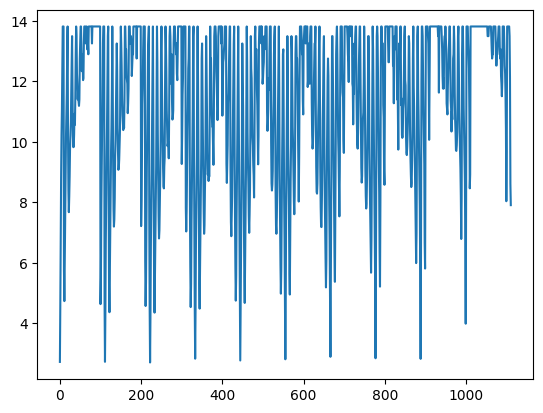

In [348]:
import matplotlib.pyplot as plt

probabilities = (occurrence/torch.sum(occurrence)).view(-1)
probabilities = -torch.log(probabilities+1e-6).view(-1,1)
plt.plot(probabilities.view(-1))

In [349]:
value_embedding = nn.Embedding(num_embeddings=NUM_BINS, embedding_dim=1) 
value_embedding.weight.data = probabilities
value_embedding = value_embedding.to("cuda")

In [350]:
class Block(torch.nn.Module):
    def __init__(self, in_channels: int, out_channels: int, upsample=1):
        super().__init__()
        self.conv = torch.nn.Conv2d(
            in_channels,
            out_channels,
            kernel_size=3,
            stride=1,
            padding=1,
            bias=False,
        )
        self.bn = torch.nn.BatchNorm2d(out_channels)
        self.relu = torch.nn.Tanh()  # todo: change to ReLU
        self.upsample = torch.nn.Upsample(scale_factor=upsample)

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        return self.upsample(self.relu(self.bn(self.conv(x))))

In [351]:
class ConvNetWithEfficientNetFeatureExtractor(torch.nn.Module):
    def __init__(self):
        super().__init__()

        self.FEATURE_EXTRACTOR_LAYERS = 9
        self.feature_extractor = efficientnet_b7(
            weights=EfficientNet_B7_Weights.IMAGENET1K_V1
        ).features
        self.feature_extractor.requires_grad_(False)

        self.colorization_layers = torch.nn.Sequential(
            Block(2560, 640),
            Block(640, 384),
            Block(384, 224, upsample=2),
            Block(224, 160),
            Block(160, 80, upsample=2),
            Block(80, 48, upsample=2),
            Block(48, 32, upsample=2),
            Block(32, 64, upsample=2),
            torch.nn.Conv2d(64, 3, kernel_size=3, stride=1, padding=1),
            torch.nn.Sigmoid(),
        )
        self.quantized = False

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        feature32 = self.feature_extractor[0:2](
            x
        )  # 3x256x256 -> 64x128x128 -> 32x128x128
        feature48 = self.feature_extractor[2](feature32)  # 32x128x128 -> 48x64x64
        feature80 = self.feature_extractor[3](feature48)  # 48x64x64 -> 80x32x32
        feature224 = self.feature_extractor[4:6](
            feature80
        )  # 80x32x32 -> 160x16x16 -> 224x16x16
        feature640 = self.feature_extractor[6:8](
            feature224
        )  # 224x16x16 -> 384x8x8 -> 640x8x8
        feature2560 = self.feature_extractor[8](feature640)  # 640x8x8 -> 2560x8x8
        
        if not self.quantized:
            out = self.colorization_layers[0](feature2560)  # 2560x8x8 -> 640x16x16
            out += feature640
            out = self.colorization_layers[1:3](out)  # 640x16x16 -> 384x32x32 -> 224x32x32
            out += feature224
            out = self.colorization_layers[3:5](out)  # 224x32x32 -> 160x64x64 -> 80x64x64
            out += feature80
            out = self.colorization_layers[5](out)  # 80x64x64 -> 48x128x128
            out += feature48
            out = self.colorization_layers[6](out)  # 48x128x128 -> 32x256x256
            out += feature32
            out = self.colorization_layers[7:10](
                out
            )  # 32x256x256 -> 64x256x256 -> 2x256x256
        else:
            out = self.colorization_layers[0](feature2560)  # 2560x8x8 -> 640x16x16
            out += feature640
            out = self.colorization_layers[1](out)  # 640x16x16 -> 384x32x32 -> 224x32x32
            out += feature224
            out = self.colorization_layers[2](out)  # 224x32x32 -> 160x64x64 -> 80x64x64
            out += feature80
            out = self.colorization_layers[3](out)  # 80x64x64 -> 48x128x128
            out += feature48
            out = self.colorization_layers[4](out)  # 48x128x128 -> 32x256x256
            out += feature32
            out = self.colorization_layers[5](out)  # 32x256x256 -> 64x256x256 -> 2x256x256
        return out

    def convert_output_to_rgb(
        self, x: torch.Tensor, output: torch.Tensor
    ) -> torch.Tensor:

        return output
        lab_img = x.clone()
        lab_img[1:] = output
        return Places365Train.lab_to_rgb(lab_img)

In [353]:
#train model

from torch.optim import AdamW
from torch.nn import MSELoss
from sklearn.model_selection import train_test_split
from tqdm import tqdm

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = ConvNetWithEfficientNetFeatureExtractor().to(device)
optimizer = AdamW(model.parameters(), lr=1e-3)
mseloss = MSELoss()
weighted_mseloss = WeightedMSELoss(value_embedding)

In [ ]:
import torchvision
import torchvision.models as models

# Load the pre-trained VGG11 model
vgg11 = models.vgg11(pretrained=True)

vgg11.features[-1]=torch.nn.Identity()
vgg11 = vgg11.features

for param in vgg11.parameters():
    param.requires_grad = False
    
vgg11 = vgg11.to(device)

In [355]:
train_loader = DataLoader(train_set, batch_size=64, shuffle=True)
val_loader = DataLoader(val_set, batch_size=64, shuffle=False)
vid_loader = DataLoader(vid_dataset, batch_size=64, shuffle=True)

In [356]:
PERCEPTUAL_LOSS_WEIGHT = 0.3
def train(model, train_loader, val_loader, loss1, loss2, optimizer, device, epochs=10):
    for epoch in range(epochs):
        model.train()
        train_loss = 0
        
        for x, y in tqdm(train_loader):      
            x, y = x.to(device), y.to(device)
            optimizer.zero_grad()
            output = model(x)
            
            loss = loss1(output, y) + PERCEPTUAL_LOSS_WEIGHT*loss2(vgg11(output),vgg11(y))
        
            loss.backward()
            optimizer.step()
            train_loss += loss.item()
#         train_loss /= len(train_loader)

        model.eval()
        val_loss = 0
        
        if val_loader is None:
            print(f"Epoch {epoch + 1}/{epochs}, Train Loss: {train_loss:.4f}")
            continue
            
        with torch.no_grad():
            for x, y in tqdm(val_loader):
                x, y = x.to(device), y.to(device)
                output = model(x)
                loss = loss1(output, y) + loss2(vgg11(output),vgg11(y))
                val_loss += loss.item()
#             val_loss /= len(val_loader)

        print(f"Epoch {epoch + 1}/{epochs}, Train Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f}")

In [357]:
# train(model, train_loader, val_loader, weighted_mseloss, mseloss, optimizer, device, epochs=1)
# train(model, vid_loader, None, weighted_mseloss, mseloss, optimizer, device, epochs=1)

In [358]:
torch.save(model.state_dict(), "model.pth")

In [359]:
torch.cuda.empty_cache()

torch.Size([3, 256, 256])


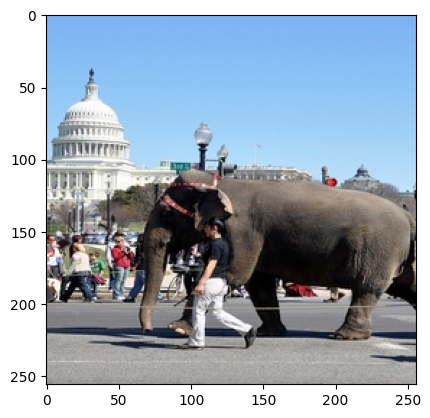

In [360]:
input = dataset[100][1].to(device)
print(input.shape)
plt.imshow(dataset.lab_to_rgb(input).permute(1, 2, 0).cpu())

torch.Size([1, 3, 256, 256])
torch.Size([3, 256, 256])


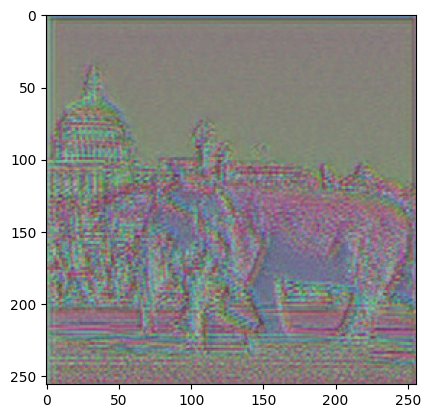

In [361]:
input = dataset[100][0].to(device).unsqueeze(0)
output = model(input)
print(output.shape)

output_img = dataset.lab_to_rgb(output.detach()[0].cpu())
print(output_img.shape)
plt.imshow(output_img.permute(1, 2, 0))

In [362]:
val_loader = DataLoader(val_set, batch_size=16)

In [363]:

# plt.figure(figsize=(20, 10))
# for x, y in val_loader:
#     x: torch.Tensor
#     y: torch.Tensor
#     n = min(x.shape[0], 16)
#     print(f"Showing {n} samples from val set", x.shape, y.shape)
#     for i in range(n):
#         # x: input, grayscale
#         plt.subplot(4, 8, i * 2 + 1)
#         plt.imshow(x[i].permute(1, 2, 0))
#         plt.axis("off")
#         # y: ground truth
#         plt.subplot(4, 8, i * 2 + 2)
#         plt.imshow(Places365Train.lab_to_rgb(y[i]).permute(1, 2, 0))
#         plt.axis("off")
    
#     break
        

Showing 16 samples from training set torch.Size([16, 3, 256, 256]) torch.Size([16, 3, 256, 256])


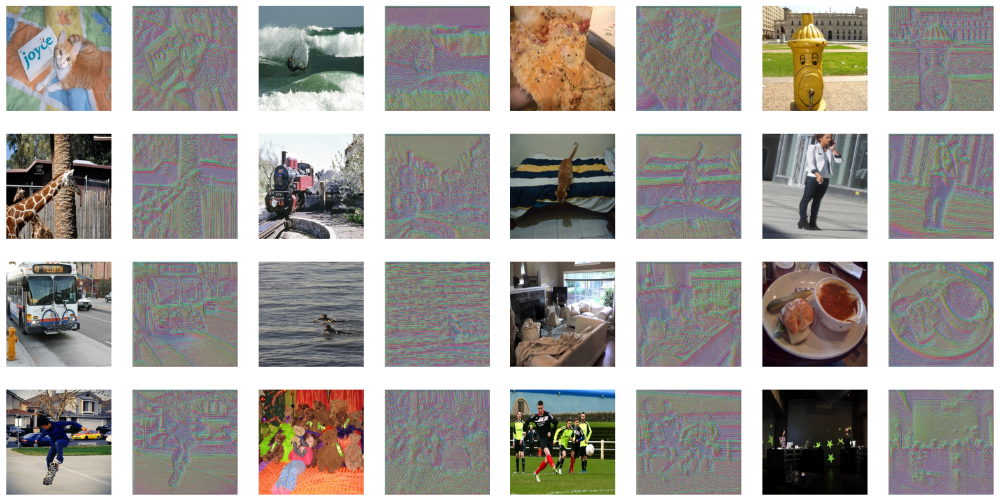

In [364]:
# vqa_dataset_images
plt.figure(figsize=(20, 10))
for x, y in val_loader:
    x: torch.Tensor
    y: torch.Tensor
    n = min(x.shape[0], 16)
    print(f"Showing {n} samples from training set", x.shape, y.shape)
    for i in range(n):
        # x: input, grayscale
        plt.subplot(4, 8, i * 2 + 1)
        plt.imshow(Places365Train.lab_to_rgb(y[i]).permute(1, 2, 0))
        plt.axis("off")
        # y: ground truth
        plt.subplot(4, 8, i * 2 + 2)
        
        input_ = x[i].to(device).unsqueeze(0)
        output = model(input_)
        output_img = model.convert_output_to_rgb(input_[0].cpu(), output.detach()[0].cpu())
        plt.imshow(output_img.permute(1, 2, 0))
        plt.axis("off")
    break

Showing 16 samples from training set torch.Size([16, 3, 256, 256]) torch.Size([16, 3, 256, 256])


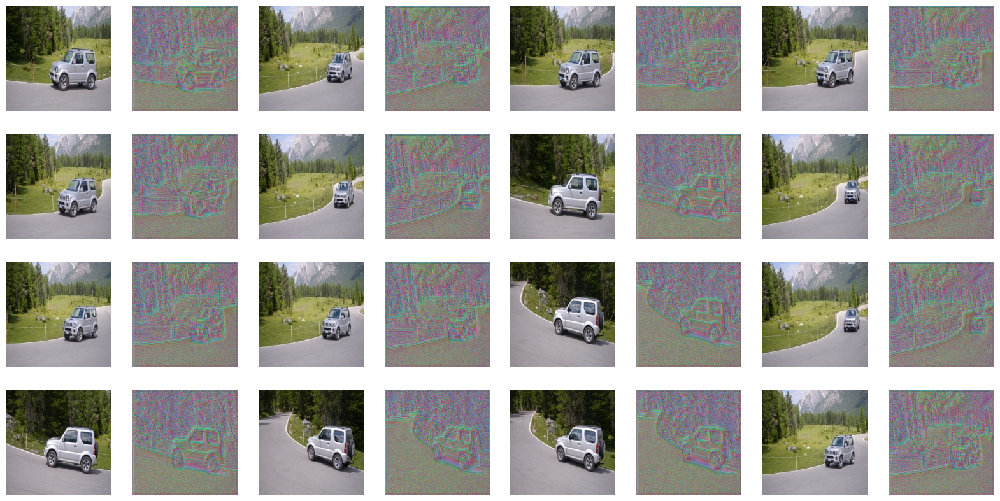

In [365]:
# vid_dataset
val_loader = DataLoader(vid_dataset, batch_size=16)
plt.figure(figsize=(20, 10))
for x, y in val_loader:
    x: torch.Tensor
    y: torch.Tensor
    n = min(x.shape[0], 16)
    print(f"Showing {n} samples from training set", x.shape, y.shape)
    for i in range(n):
        # x: input, grayscale
        plt.subplot(4, 8, i * 2 + 1)
        plt.imshow(Places365Train.lab_to_rgb(y[i]).permute(1, 2, 0))
        plt.axis("off")
        # y: ground truth
        plt.subplot(4, 8, i * 2 + 2)
        
        input_ = x[i].to(device).unsqueeze(0)
        output = model(input_)
        output_img = model.convert_output_to_rgb(input_[0].cpu(), output.detach()[0].cpu())
        plt.imshow(output_img.permute(1, 2, 0))
        plt.axis("off")
    break

# Pruning

In [366]:
def get_all_layers(model):
    layers = []

    def _get_layers_recursive(module):
        if not list(module.children()):
            layers.append(module)
        else:
            for child in module.children():
                _get_layers_recursive(child)
    _get_layers_recursive(model)
    return layers

def get_num_parameters(model: nn.Module, count_nonzero_only=False) -> int:
    num_counted_elements = 0
    for param in model.parameters():
        if count_nonzero_only:
            num_counted_elements += param.count_nonzero()
        else:
            num_counted_elements += param.numel()
    return num_counted_elements

def get_next_conv_layer(layers, k):
    for i in range(k+1,len(layers)):
        if isinstance(layers[i], nn.Conv2d) and layers[k].weight.shape[1] == layers[i].weight.shape[0]:
            
            return i
    return -1

def get_prev_conv_layer(layers, k):
    for i in reverse(range(0,k)):
        if isinstance(layers[i], nn.Conv2d):
            return i
    return -1

def get_num_channels_to_keep(channels: int, prune_ratio: float) -> int:
    return int(round(channels*(1-prune_ratio)))

def find_index(layers, target):
    for i, layer in enumerate(layers):
        if layer == target:
            return i
def get_out_channel_importance(weight):
    out_channels = weight.shape[0]
    importances = []
    # compute the importance for each input channel
    for o_c in range(weight.shape[0]):
        channel_weight = weight.detach()[o_c]
        importance = torch.linalg.norm(channel_weight)
        importances.append(importance.view(1))
    return torch.cat(importances)
def get_keep_indices(conv_layer, p_ratio):
    n_keep = get_num_channels_to_keep(conv_layer.out_channels, p_ratio)
    importance = get_out_channel_importance(conv_layer.weight)
    sort_idx = torch.argsort(importance, descending=True)
    return sort_idx[:n_keep]

In [399]:
import copy
model = ConvNetWithEfficientNetFeatureExtractor()
model.load_state_dict(torch.load("/kaggle/input/video-trained/model.pth"))
model2 = copy.deepcopy(model)

In [401]:
model2 = model2.to("cpu")
model2.eval()
layers = get_all_layers(model2.feature_extractor)
print("copied")

copied


In [402]:
prune_type_1 = []
prune_type_2 = []
prune_type_3 = []
prune_type_4 = []


for i in range(len(layers)-2):
    if isinstance(layers[i], nn.Conv2d) and isinstance(layers[i+1], nn.BatchNorm2d):
        if isinstance(layers[i+2], nn.SiLU):
            prune_type_1.append(i)
        else:
            prune_type_2.append(i)
    if isinstance(layers[i], nn.Conv2d) and isinstance(layers[i+1],nn.Conv2d):
        prune_type_3.append(i)
        prune_type_4.append(i+1)

print(len(prune_type_1), len(prune_type_2), len(prune_type_3),  len(prune_type_4))

108 55 55 55


In [403]:
conv_layer = model2.colorization_layers[1].conv
bn_layer =  model2.colorization_layers[1].bn
next_conv =  model2.colorization_layers[2].conv

In [404]:
p_ratio = 0.3
n_keep = get_num_channels_to_keep(conv_layer.out_channels, p_ratio)
keep_idx = get_keep_indices(conv_layer, p_ratio)

with torch.no_grad():
    bn_layer.weight.set_(bn_layer.weight.detach()[keep_idx])
    bn_layer.bias.set_(bn_layer.bias.detach()[keep_idx])
    bn_layer.running_mean.set_(bn_layer.running_mean.detach()[keep_idx])
    bn_layer.running_var.set_(bn_layer.running_var.detach()[keep_idx])

    conv_layer.out_channels = n_keep
    conv_layer.weight.set_(conv_layer.weight.detach()[keep_idx])

    if conv_layer.bias is not None:
        conv_layer.bias.set_(conv_layer.bias.detach()[keep_idx])

    if next_conv_layer.groups > 1:
        next_conv_layer.groups = n_keep

    next_conv_layer.in_channels = n_keep
    next_conv.weight.set_(next_conv.weight.detach()[:,keep_idx,:,:])

In [405]:
get_num_parameters(model2)/get_num_parameters(model)

0.9890955680256702

In [406]:
model2.feature_extractor[8] = nn.Identity()
model2.colorization_layers[0] = nn.Identity()

In [407]:
get_num_parameters(model2)/get_num_parameters(model)

0.7892811507371589

In [408]:
p_ratio = 0.5
for i in prune_type_3:
    conv_layer = layers[i]    
    next_conv_layer = layers[i+1]

    n_keep = get_num_channels_to_keep(conv_layer.out_channels, p_ratio)
    keep_idx = get_keep_indices(conv_layer, p_ratio)
    
    conv_layer.out_channels = n_keep
    conv_layer.weight.set_(conv_layer.weight.detach()[keep_idx])
    
    if conv_layer.bias is not None:
        conv_layer.bias.set_(conv_layer.bias.detach()[keep_idx])

    next_conv_layer.weight.set_(next_conv_layer.weight.detach()[:,keep_idx,:,:])
    if next_conv_layer.groups > 1:
        next_conv_layer.groups = n_keep
    next_conv_layer.in_channels = n_keep

In [409]:
get_num_parameters(model2)/get_num_parameters(model)

0.7167275878520432

### VQA dataset - unpruned

Showing 4 samples from training set torch.Size([16, 3, 256, 256]) torch.Size([16, 3, 256, 256])
Showing 4 samples from training set torch.Size([16, 3, 256, 256]) torch.Size([16, 3, 256, 256])


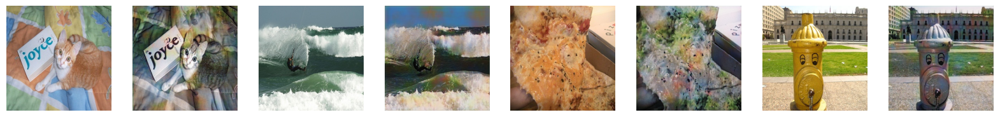

In [410]:
model = model.to(device)
plt.figure(figsize=(20, 10))
for x, y in val_loader:
    x: torch.Tensor
    y: torch.Tensor
    n = min(x.shape[0], 4)
    print(f"Showing {n} samples from training set", x.shape, y.shape)
    for i in range(n):
        # x: input, grayscale
        plt.subplot(4, 8, i * 2 + 1)
        plt.imshow(Places365Train.lab_to_rgb(y[i]).permute(1, 2, 0))
        plt.axis("off")
        # y: ground truth
        plt.subplot(4, 8, i * 2 + 2)
        
        input_ = x[i].to(device).unsqueeze(0)
        output = model(input_)
        output_img = model.convert_output_to_rgb(input_[0].cpu(), output.detach()[0].cpu())
        plt.imshow(output_img.permute(1, 2, 0))
        plt.axis("off")
    break
print(f"Showing {n} samples from training set", x.shape, y.shape)

### VQA dataset - pruned

Showing 4 samples from training set torch.Size([16, 3, 256, 256]) torch.Size([16, 3, 256, 256])
Showing 4 samples from training set torch.Size([16, 3, 256, 256]) torch.Size([16, 3, 256, 256])


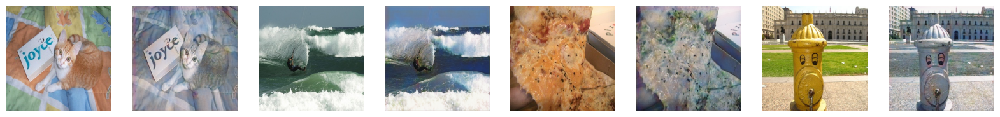

In [411]:
model2 = model2.to(device)
plt.figure(figsize=(20, 10))
for x, y in val_loader:
    x: torch.Tensor
    y: torch.Tensor
    n = min(x.shape[0], 4)
    print(f"Showing {n} samples from training set", x.shape, y.shape)
    for i in range(n):
        # x: input, grayscale
        plt.subplot(4, 8, i * 2 + 1)
        plt.imshow(Places365Train.lab_to_rgb(y[i]).permute(1, 2, 0))
        plt.axis("off")
        # y: ground truth
        plt.subplot(4, 8, i * 2 + 2)
        
        input_ = x[i].to(device).unsqueeze(0)
        output = model2(input_)
        output_img = model.convert_output_to_rgb(input_[0].cpu(), output.detach()[0].cpu())
        plt.imshow(output_img.permute(1, 2, 0))
        plt.axis("off")
    break
print(f"Showing {n} samples from training set", x.shape, y.shape)


In [412]:
model2.to(device)
model2.requires_grad_= True

optimizer = AdamW(model2.parameters(), lr=1e-5)
mseloss = MSELoss()
weighted_mseloss = WeightedMSELoss(value_embedding)

val_loader = DataLoader(val_set, batch_size=64)
# train(model, train_loader, val_loader, weighted_mseloss, mseloss, optimizer, device, epochs=1)
# train(model, vid_loader, None, weighted_mseloss, mseloss, optimizer, device, epochs=1)

In [413]:
torch.save(model2.state_dict(), "model_p.pth")

### video dataset - unpruned

Showing 4 samples from training set torch.Size([16, 3, 256, 256]) torch.Size([16, 3, 256, 256])
Showing 4 samples from training set torch.Size([16, 3, 256, 256]) torch.Size([16, 3, 256, 256])


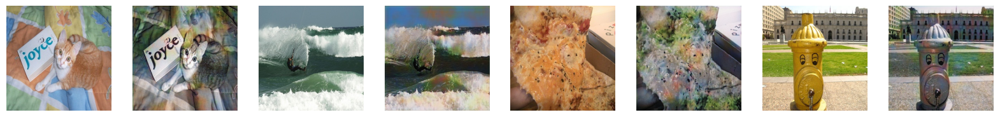

In [414]:
val_loader = DataLoader(val_set, batch_size=16)
plt.figure(figsize=(20, 10))
for x, y in val_loader:
    x: torch.Tensor
    y: torch.Tensor
    n = min(x.shape[0], 4)
    print(f"Showing {n} samples from training set", x.shape, y.shape)
    for i in range(n):
        # x: input, grayscale
        plt.subplot(4, 8, i * 2 + 1)
        plt.imshow(Places365Train.lab_to_rgb(y[i]).permute(1, 2, 0))
        plt.axis("off")
        # y: ground truth
        plt.subplot(4, 8, i * 2 + 2)
        
        input_ = x[i].to(device).unsqueeze(0)
        output = model(input_)
        output_img = model.convert_output_to_rgb(input_[0].cpu(), output.detach()[0].cpu())
        plt.imshow(output_img.permute(1, 2, 0))
        plt.axis("off")
    break
print(f"Showing {n} samples from training set", x.shape, y.shape)

### video dataset - pruned

Showing 4 samples from training set torch.Size([16, 3, 256, 256]) torch.Size([16, 3, 256, 256])
Showing 4 samples from training set torch.Size([16, 3, 256, 256]) torch.Size([16, 3, 256, 256])


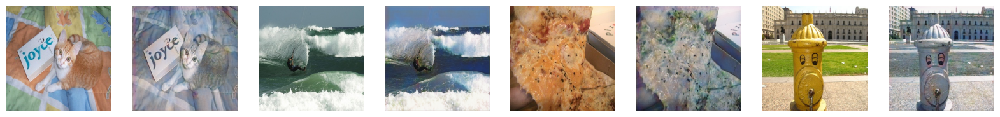

In [415]:
val_loader = DataLoader(val_set, batch_size=16)
plt.figure(figsize=(20, 10))
for x, y in val_loader:
    x: torch.Tensor
    y: torch.Tensor
    n = min(x.shape[0], 4)
    print(f"Showing {n} samples from training set", x.shape, y.shape)
    for i in range(n):
        # x: input, grayscale
        plt.subplot(4, 8, i * 2 + 1)
        plt.imshow(Places365Train.lab_to_rgb(y[i]).permute(1, 2, 0))
        plt.axis("off")
        # y: ground truth
        plt.subplot(4, 8, i * 2 + 2)
        
        input_ = x[i].to(device).unsqueeze(0)
        output = model2(input_)
        output_img = model.convert_output_to_rgb(input_[0].cpu(), output.detach()[0].cpu())
        plt.imshow(output_img.permute(1, 2, 0))
        plt.axis("off")
    break
print(f"Showing {n} samples from training set", x.shape, y.shape)

In [416]:
model2 = model2.to("cpu")
val_loader = DataLoader(val_set, batch_size=256, shuffle=True)

for x,y in val_loader:
    print(x.shape)
    break

torch.Size([256, 3, 256, 256])


In [417]:
feature32 = model2.feature_extractor[0:2](x) 
feature48 = model2.feature_extractor[2](feature32) 
feature80 = model2.feature_extractor[3](feature48) 
feature224 = model2.feature_extractor[4:6](feature80)
feature640 = model2.feature_extractor[6:8](feature224)
feature2560 = model2.feature_extractor[8](feature640)

In [418]:
import torch
from torch import nn
import copy

backend = "fbgemm"
m = copy.deepcopy(model2).to("cpu")
m.eval()
ITERATIONS = 5

In [419]:
def get_quantized(layer, sample_input):
    q = nn.Sequential(torch.quantization.QuantStub(), 
                  layer, 
                  torch.quantization.DeQuantStub())
    q.qconfig = torch.quantization.get_default_qconfig(backend)
    torch.quantization.prepare(q, inplace=True)

    with torch.inference_mode():
        for _ in range(ITERATIONS):
            out = q(sample_input)
    torch.quantization.convert(q, inplace=True)
    return q, out

In [420]:
q0, out = get_quantized(m.colorization_layers[0],feature2560)
q1, out = get_quantized(m.colorization_layers[1:3],feature640+out)
q2, out = get_quantized(m.colorization_layers[3:5],feature224+out)
q3, out = get_quantized(m.colorization_layers[5],feature80+out)
q4, out = get_quantized(m.colorization_layers[6],feature48+out)
q5, out = get_quantized(m.colorization_layers[7:10],feature32+out)

In [421]:
val_loader = DataLoader(val_set, batch_size=1000)
for x, y in tqdm(val_loader):
    print(x.shape)
    break

  0%|          | 0/9 [00:11<?, ?it/s]

torch.Size([1000, 3, 256, 256])


### Pruned Model

In [422]:
%%time
for i in tqdm(range(x.shape[0])):
    output = model2(x[i].unsqueeze(0))

100%|██████████| 1000/1000 [04:23<00:00,  3.79it/s]

CPU times: user 8min 45s, sys: 2.64 s, total: 8min 47s
Wall time: 4min 23s


### Base Model

In [423]:
model = model.to("cpu")

In [424]:
%%time
for i in tqdm(range(x.shape[0])):
    output = model(x[i].unsqueeze(0))

100%|██████████| 1000/1000 [06:20<00:00,  2.63it/s]

CPU times: user 12min 39s, sys: 3.02 s, total: 12min 42s
Wall time: 6min 20s


### Pruned and Quantized Model

In [425]:
model2.colorization_layers = nn.Sequential(q0,q1,q2,q3,q4,q5)
model2.quantized = True

In [426]:
%%time
for i in tqdm(range(x.shape[0])):
    output = model2(x[i].unsqueeze(0))

100%|██████████| 1000/1000 [04:29<00:00,  3.71it/s]

CPU times: user 8min 57s, sys: 2.59 s, total: 8min 59s
Wall time: 4min 29s


In [ ]:
torch.save(model2.state_dict(), "model_pq.pth")

In [432]:
!ls -l

total 1000832
drwxr-xr-x 5 root root      4096 Oct 31  2016 DAVIS
-rw-r--r-- 1 root root 329787682 Feb 24 06:23 model.pth
-rw-r--r-- 1 root root 236866230 Feb 24 06:30 model_p.pth
-rw-r--r-- 1 root root 229089358 Feb 24 06:51 model_pq.pth
-rw-r--r-- 1 root root 229087676 Feb 24 06:18 model_q.pth


Showing 16 samples from training set torch.Size([16, 3, 256, 256]) torch.Size([16, 3, 256, 256])
Showing 16 samples from training set torch.Size([16, 3, 256, 256]) torch.Size([16, 3, 256, 256])
CPU times: user 9.41 s, sys: 201 ms, total: 9.61 s
Wall time: 5.09 s


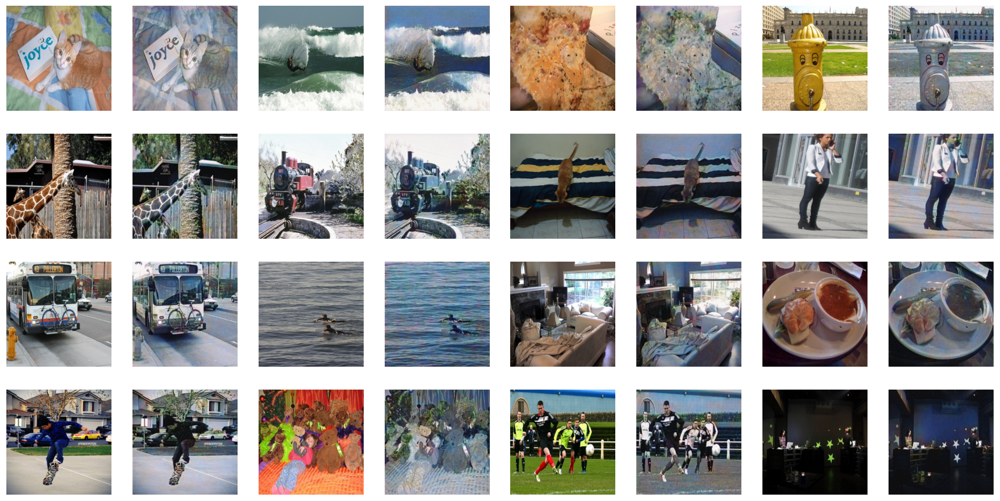

In [428]:
%%time
val_loader = DataLoader(val_set, batch_size=16)
plt.figure(figsize=(20, 10))
for x, y in val_loader:
    x: torch.Tensor
    y: torch.Tensor
    n = min(x.shape[0], 16)
    print(f"Showing {n} samples from training set", x.shape, y.shape)
    for i in range(n):
        # x: input, grayscale
        plt.subplot(4, 8, i * 2 + 1)
        plt.imshow(Places365Train.lab_to_rgb(y[i]).permute(1, 2, 0))
        plt.axis("off")
        # y: ground truth
        plt.subplot(4, 8, i * 2 + 2)
        
        input_ = x[i].to("cpu").unsqueeze(0)
        output = model2(input_)
        output_img = model.convert_output_to_rgb(input_[0].cpu(), output.detach()[0].cpu())
        plt.imshow(output_img.permute(1, 2, 0))
        plt.axis("off")
    break
print(f"Showing {n} samples from training set", x.shape, y.shape)

In [429]:
# saving and loading pruned models do not work for now. (Weight mismatch)